# Austin Acccidents

## Data Analytics and Visualization Bootcamp
* Bianca Hernandez 
* Neil Hsu 
* Ningning Mussomeli 
* Carlos Santillan

## Dataset

Description
This is a countrywide car accident dataset, which covers 49 states of the United States. The data is collected from February 2016 to December 2019, using several data providers, including two APIs that provide streaming traffic incident data. These APIs broadcast traffic data captured by a variety of entities, such as the US and state departments of transportation, law enforcement agencies, traffic cameras, and traffic sensors within the road-networks. Currently, there are about 3.0 million accident records in this dataset. Check [here](https://smoosavi.org/datasets/us_accidents) to learn more about this dataset.

Data Sources:

* https://www.kaggle.com/sobhanmoosavi/us-accidents
* https://smoosavi.org/datasets/us_accidents

Moosavi, Sobhan, Mohammad Hossein Samavatian, Srinivasan Parthasarathy, and Rajiv Ramnath. “A Countrywide Traffic Accident Dataset.”, 2019.

Moosavi, Sobhan, Mohammad Hossein Samavatian, Srinivasan Parthasarathy, Radu Teodorescu, and Rajiv Ramnath. "Accident Risk Prediction based on Heterogeneous Sparse Data: New Dataset and Insights." In proceedings of the 27th ACM SIGSPATIAL International Conference on Advances in Geographic Information Systems, ACM, 2019.


In [1]:
# Dependencies and Setup
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import datetime   # handle date times
import re         # regular expression package

import folium
from folium.plugins import HeatMap

import dtale # data Frame visualization

In [2]:
#Load the Data
# Check if data has been pickled and if so load pickle
if os.path.exists('data/txDF.pkl') :
    txDF=pd.read_pickle('data/txDF.pkl',compression='gzip')
    tx_metro_cities_df = pd.read_pickle('data/tx_metro_cities.pkl',compression='gzip')    
else:
# pickle only the attributes we are interested in, and compress
# pickle is much faster/smaller than csv
    df = pd.read_csv('data/US_Accidents_Dec19.csv',encoding='utf-8')
    columns_of_interest=[
        'ID','Severity','Start_Time','End_Time','Start_Lat', 'Start_Lng', 'City', 
        'County', 'State','Zipcode', 'Country','Visibility(mi)', 
        'Weather_Condition','Precipitation(in)','Sunrise_Sunset','Civil_Twilight'
    ]
    condition=df['State'] =='TX'
    txDF=df[condition][columns_of_interest]
    #create df for selected cities 
    tx_metro_cities =  ['Austin', 'Round Rock', 'Cedar Park',
                 'San Marcos', 'Georgetown', 'Pflugerville',
                 'Hutto', 'Buda', 'Kyle', 'Leander',
                 'Dallas', 'Fort Worth', 'Arlington', 
                 'Plano','Garland', 'Irving', 'McKinney', 
                 'Frisco','Denton','Richardson', 'Allen','El Paso',
                 'Houston', 'The Woodlands', 'Sugar Land',
                 'Baytown', 'Conroe','San Antonio', 'New Braunfels', 
                 'Schertz', 'Seguin']
    condition = txDF['City'].isin(tx_metro_cities)
    tx_metro_cities_df = txDF[condition]    
    txDF.to_pickle("data/txDF.pkl",compression='gzip')
    tx_metro_cities_df.to_pickle("data/tx_metro_cities.pkl",compression='gzip')


In [3]:
# add_datepart from fastai API
# Date Feature Engineering # will split data colum in to corresponding 'Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear'
# 'Hour', 'Minute'
def add_datepart(df, fldname, drop=True,time=False):
    fld = df[fldname]
    attributes = ['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear']
    if time: attributes = attributes + ['Hour', 'Minute']
    #, 'Is_month_end', 'Is_month_start', 'Is_quarter_end', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']
    if not np.issubdtype(fld.dtype, np.datetime64):
        df[fldname] = fld = pd.to_datetime(fld, infer_datetime_format=True)
    targ_pre = re.sub('[Dd]ate$', '', fldname)
    for n in attributes:
        df[targ_pre+n] = getattr(fld.dt,n.lower())
    df[targ_pre+'Elapsed'] = fld.astype(np.int64) // 10**9
    if drop: df.drop(fldname, axis=1, inplace=True)
        
add_datepart(tx_metro_cities_df,'Start_Time',False,True )  

In [4]:
# use name for DOW
weekdays = ["Monday","Tuesday","Wednesday","Thursday","Friday"]
weekenddays =["Saturday","Sunday"]
def dow(df):
    days=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
    return days[df]
tx_metro_cities_df['Start_TimeDayofweek'] =tx_metro_cities_df['Start_TimeDayofweek'].apply(dow)

In [5]:
def plot_map(df,LatLong, city=None):
    accident_map = folium.Map(location=LatLong, 
                           tiles = "OpenStreetMap",                              
                           zoom_start = 10)
    if city != None:
        data_heatmap = df[df["City"] == city]
    else:
        data_heatmap = df.copy()
    data_heatmap = data_heatmap[['Start_Lat','Start_Lng']]
    data_heatmap = [[row['Start_Lat'],row['Start_Lng']] for index, row in data_heatmap.iterrows()]
    HeatMap(data_heatmap, radius=10).add_to(accident_map)
    return accident_map

In [6]:
plot_map(tx_metro_cities_df,[30.2672,-97.7431])

# Number of traffic accidents in Austin

Analysis of traffic accidents in Austin for 2018 by day of the week


In [7]:
# Set here the year and city values to use for presentation
year=2018
city='Austin'

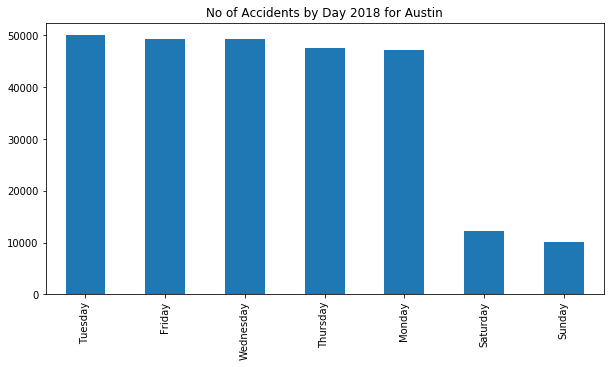

In [8]:

condition = (tx_metro_cities_df['Start_TimeYear'] == year) & (tx_metro_cities_df['City'] == city)
fig, ax = plt.subplots(figsize=(10,5))
tx_metro_cities_df['Start_TimeDayofweek'].value_counts().plot(kind='bar',  title=f'No of Accidents by Day {year} for {city}', ax=ax)


In [9]:
#condfig for bar charts
types=['Morning Rush','Evening Rush']
morning_rush_hours=[7,8,9]
evening_rush_hour=[16,17,18]
condition = (tx_metro_cities_df['Start_TimeYear'] == year) & (tx_metro_cities_df['City'] == city)& (tx_metro_cities_df['Start_TimeDayofweek'].isin(weekdays)) 
colors = ["#006D2C", "#31A354","#74C476"]
colors2 = ["#ff8c66", "#ff531a","#cc3300"]

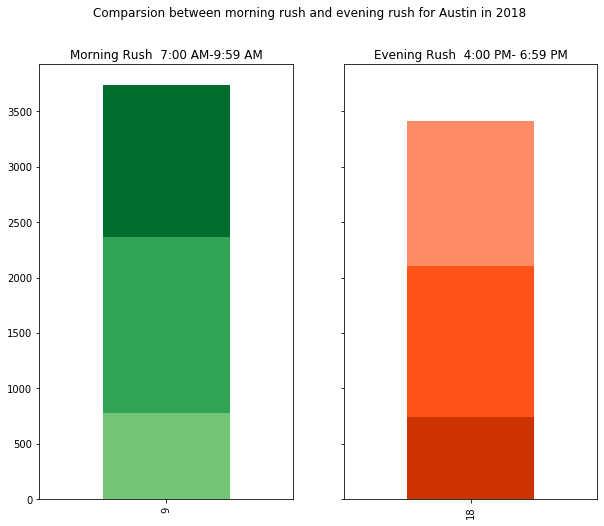

In [10]:
condition = (tx_metro_cities_df['Start_TimeYear'] == year) & (tx_metro_cities_df['City'] == city)& (tx_metro_cities_df['Start_TimeDayofweek'].isin(weekdays)) 
df = tx_metro_cities_df[condition]

fig, ((ax0),(ax1)) = plt.subplots(nrows=1,ncols=2,figsize=(10,8),sharey=True)  
margin_bottom = len(df[df['Start_TimeHour'].isin(morning_rush_hours)])
for num, val in enumerate(morning_rush_hours):
    condition =df['Start_TimeHour'] == val
    values = len(df[condition])
    margin_bottom -= values
    df[condition]['Start_TimeHour'] .value_counts().plot(kind='bar', ax=ax0,
                                     bottom = margin_bottom,color=colors[num],legend=False,title='Morning Rush  7:00 AM-9:59 AM')

margin_bottom= len(df[df['Start_TimeHour'].isin(evening_rush_hour)])
for num, val in enumerate(evening_rush_hour):
    condition =df['Start_TimeHour'] == val
    values = len(df[condition])
    margin_bottom -= values    
    df[condition]['Start_TimeHour'] .value_counts().plot(kind='bar', ax=ax1,
                                     bottom = margin_bottom,color=colors2[num],legend=False,title='Evening Rush  4:00 PM- 6:59 PM')

fig.suptitle(f'Comparsion between morning rush and evening rush for {city} in {year}')

plt.show()
